### Download Kaggle Datasets


In [ ]:
! pip install kaggle -q


In [ ]:
! mkdir ~/.kaggle


In [ ]:
! cp drive/MyDrive/Kaggle_API_tokens/kaggle.json ~/.kaggle/


In [ ]:
! chmod 600  ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download andrewmvd/face-mask-detection --force


In [ ]:
! mkdir ./kaggle


In [ ]:
! unzip -q face-mask-detection.zip -d ./kaggle 

In [ ]:
! mkdir ./second_kaggle


In [ ]:
! kaggle datasets download prithwirajmitra/covid-face-mask-detection-dataset --force


In [ ]:
! unzip -q covid-face-mask-detection-dataset.zip  -d ./second_kaggle  

In [ ]:
! mkdir ./aug


In [ ]:
# ! rm -r ./aug

### Import Libraries


In [1]:
pip install mtcnn -q

     |████████████████████████████████| 2.3 MB 4.3 MB/s 


In [2]:
import numpy as np # linear algebra
import pandas as pd 
import os
import xml.etree.ElementTree as et
import re
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import numpy as np
import argparse
import pandas as pd
import glob
import os
import cv2
import random as rand
import time 
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input
from keras import Sequential
import tensorflow as tf
import keras
from  keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.layers import AveragePooling2D,Conv2D,MaxPool2D
import json
from mtcnn.mtcnn import MTCNN


In [ ]:
!pip freeze > requirements.txt

### Generic Functions

In [3]:

def perc_black_image(image):
  '''
  Return True of False, if an image is
  above 90% black
  '''
  if 90.0 >= 100.*(1.-cv2.mean(image)[0]/255.):
    return False
  else:
    return True

def preprocess_dataset(image):
    '''
    Resize the np array in 200 x 200 pixels
    '''
    image = tf.image.resize(image, (200, 200))
    return image

def extract_face(filename, result_list):
    '''
    Based on a bounding box, 
    extract only the face from the image
    '''
    # Load the image
    data = cv2.imread(filename)
    data = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)

    extract_faces=[]
    # Plot each face as a sub-plot
    for i in range(len(result_list)):
        x1, y1, width, height = result_list[i]["box"]
        x2, y2 = x1 + width, y1 + height
        extract_faces.append(data[y1:y2, x1:x2])
        break
    return extract_faces

def extract_images_label(dataset,label):
  '''
  Return a list of images,
  based on a filepath
  '''
  root_path = "./second_kaggle/New Masks Dataset/"+dataset+"/"+label+"/"
  counter = 0
  labels =[]
  list_images = []
  for path_image in (os.listdir(root_path)):
    img=plt.imread(root_path+path_image)
    list_images.append((img,root_path+path_image,label))
  return list_images

def display_25_images(im_list):
  '''
  Display 25 images, 
  based on a list of images
  '''
  w = 10
  h = 10
  fig = plt.figure(figsize=(8, 8))
  columns = 5
  rows = 5
  counter =0
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      plt.imshow(im_list[counter])
      plt.axis('off')
      counter  = counter + 1
  plt.show()

def dict_generate_w_Data_Augmentation(img,label,batch_threshold):
  '''
  Initiate an ImageDataGenerator
  in order to have Synthetic Data
  '''
  datagen = ImageDataGenerator()
  x = img.reshape(1,200,200,3)
  total_batch = 0
  for batch in datagen.flow(x, batch_size=1,save_to_dir='./aug',save_prefix=label, save_format='png'):
    total_batch = total_batch + 1
    if total_batch == batch_threshold:
        break 

def target_counts(final_labels):
  '''
  display the unique counts per label
  '''
  dis_y = np.argmax(final_labels, axis=-1)
  unique , counts = np.unique(dis_y, return_counts=True)
  for i in zip(unique , counts):
    if i[0]==0:
      print('There are '+i[1]+' images of individuals wearing Facemask ')
    elif i[0]==1:
      print('There are '+i[1]+' images of individuals NOT wearing Facemask ')

def define_train_test_split(n,final_data,final_labels):
  '''
  Custom Function of Train - Test Split
  '''
  test_index = np.random.choice(final_data.shape[0], n, replace=False)  
  x_test = final_data[test_index]
  x_train = np.delete(final_data, test_index,axis=0)
  y_test = final_labels[test_index]
  y_train = np.delete(final_labels, test_index,axis=0)
  return x_train , y_train , x_test , y_test

def draw_faces(filename, result_list):
  '''
    Based on a bounding box, 
    extract only the face from the image
  '''
  # Load the image
  data = cv2.imread(filename)
  data = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
  extract_faces=[]
  # Plot each face as a sub-plot
  for i in range(len(result_list)):
      x1, y1, width, height = result_list[i]["box"]
      x2, y2 = x1 + width, y1 + height
      extract_faces.append(data[y1:y2, x1:x2])
  return extract_faces
    
def display_25_images_prob(im_list):
  '''
  Display 25 images with the respective probabilities as Title, 
  based on a tuple of images
  '''
  w = 10
  h = 10
  fig = plt.figure(figsize=(15, 15))
  columns = 5
  rows = 5
  counter =0
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      plt.imshow(im_list[counter][0])
      plt.title(im_list[counter][1]+' '+im_list[counter][2] )
      plt.axis('off')
      counter  = counter + 1
  plt.show()

def model_score_data(resized_score_data,model):
  '''
  evaluate the score images based on a model,
  return a list of tuple, having the image,prediction & probability
  '''
  my_tuple = []
  for r in resized_score_data:
    res =np.argmax(model.predict(r.reshape(1,200,200,3)))
    if res == 0:
      predictions = 'facemask'
    elif res==1:
      predictions= 'no facemask'
    prob = (str(round(100*np.max(model.predict(r.reshape(1,200,200,3)) ),3))+'%')
    my_tuple.append ((r,predictions,prob))
  return my_tuple

def create_score_data():
  '''
  Based on an already defined score filepath,
  extract 100 images and return the respective np array (normalised)
  '''
  score_images = []
  score_path ="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/"
  limit=0
  for file in os.listdir(score_path):
      img=plt.imread(score_path+file)
      score_images.append((img,score_path+file))
      limit = limit + 1
      if limit==100:
        break

  test_data =[]
  detector = MTCNN()
  for t in score_images:
    faces = detector.detect_faces(t[0])
    test_data.extend(draw_faces(t[1], faces))

  resized_score_data = []
  for t in test_data:
    resized_score_data.append(preprocess_dataset(t))

  resized_score_data = np.array(resized_score_data, dtype="float32")
  resized_score_data = resized_score_data.astype('float32')
  resized_score_data/=255
  return resized_score_data

def label_prob_model_score_point(temp_img,model):
  '''
  Based only in one image as argument,
  return the probability & the prediction
  '''
  pr_class = np.argmax(model.predict(temp_img.reshape(1,200,200,3)))
  if pr_class == 0 :
    pr_label = 'facemask'
  elif pr_class == 1 :
    pr_label = 'no facemask'
  prob = (str(round(100*np.max(model.predict(temp_img.reshape(1,200,200,3)) ),3))+'%')
  return pr_label , prob


def draw_accurate_faces(filename, result_list):
    '''
    Based on a bounding box, 
    extract only the face from the image,
    BUT with a confidence from the face detector, which exceeds the 80%
    '''
    # Load the image
    data = cv2.imread(filename)
    data = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
    extract_faces=[]
    keep_dim = []
    # Plot each face as a sub-plot
    for i in range(len(result_list)):
        if  result_list[i]["confidence"] >= 0.80:
          x1, y1, width, height = result_list[i]["box"]
          x2, y2 = x1 + width, y1 + height
          extract_faces.append(data[y1:y2, x1:x2])
          keep_dim.append([x1, y1,x2, y2])
    return extract_faces ,keep_dim

def make_rectangle(xy_dimensions,bgr_img,pr_label ,prob):
  '''
  Create a rectangle from the image
  '''
  x1, y1, x2, y2 = xy_dimensions
  pres_img = cv2.rectangle(bgr_img,(x1, y1), (x2, y2), (255,0,0), 2)
  cv2.putText(pres_img,pr_label+' '+prob,(x1, y1-10),cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)
  return pres_img
  
def visualize_score(input_path,model):
  '''
  Based on a certain filepath, load the image,
  apply Face detection , transform and normalize the data
  and finally visualize the images based on the predictions of the model
  '''
  double_image = []
  test_data =[]
  display_list = []
  keep_xy_dimensions = []
  score_path_file = input_path
  img=plt.imread(score_path_file)
  bgr_img = cv2.imread(score_path_file)
  bgr_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
  double_image.append((img,score_path_file))
  display_list.append((img,'Original') )
  detector = MTCNN()
  for t in double_image:
    faces = detector.detect_faces(t[0])
    extract_faces ,keep_dim = draw_accurate_faces(t[1], faces)
    test_data.extend(extract_faces)
    keep_xy_dimensions.extend(keep_dim)

  resized_score_data = []
  for t in test_data:
    resized_score_data.append(preprocess_dataset(t))
  resized_score_data = np.array(resized_score_data, dtype="float32")
  resized_score_data = resized_score_data.astype('float32')
  resized_score_data/=255
  for r in resized_score_data:
    display_list.append((r,'Face Detection'))


  for ind,r in enumerate(resized_score_data):
      pr_label , prob = label_prob_model_score_point(temp_img=r,model=model)
      pres_img = make_rectangle(keep_xy_dimensions[ind],bgr_img,pr_label , prob)
  display_list.append((pres_img,'Final Prediction') )

  w = 10
  h = 10
  fig = plt.figure(figsize=(40, 40))
  columns = len(display_list) -1
  rows = 1
  counter =0
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      if counter == len(display_list) - 1:
        break
      plt.imshow(display_list[counter][0])
      plt.title(display_list[counter][1] )
      plt.axis('off')
      counter  = counter + 1

  plt.show()
  print()

  plt.figure(figsize = (10,10))
  plt.imshow(display_list[-1][0])
  plt.title(display_list[-1][1] )
  plt.axis('off')


### Function of 1st Dataset (Source: HumansintheLoop - High Resolution Images)


In [ ]:
def custom_dataset():
  root_path = "./drive/MyDrive/Dataset_medical_mask/train_test_medical_mask/Medical Mask/"
  counter = 0
  labels =[]
  data_img = []
  suspect_img = []
  for image in (os.listdir(root_path+'images')):
    img = cv2.imread(root_path+'images/'+image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if counter >= 5000:
      break
    for ann_file in (os.listdir(root_path+"annotations")):
      if image == ann_file[:-5]:
        f = open(root_path +"annotations/"+ann_file)
        data = json.load(f)
        ann = data.get('Annotations')
        for a in ann:
          if a.get('classname') in ['face_with_mask','face_other_covering','face_no_mask']:
            bbox = a.get('BoundingBox')
            x1, y1, width, height = bbox
            x2, y2 = x1 + width, y1 + height
            t_img = img[y1:y2, x1:x2]
            if perc_black_image(t_img):
              suspect_img.append(t_img)
            else:
              data_img.append(t_img)
              labels.append(a.get('classname'))
              counter = counter +1
              print(counter)

  resized_data = []
  for d in data_img:
    resized_data.append(preprocess_dataset(d))

  resized_data = np.array(resized_data, dtype="float32")
  resized_data = resized_data.astype('float32')
  resized_data/=255

  numeric_labels = []
  for l in labels:
    if l=='face_with_mask':
      numeric_labels.append(0)
    elif (l=='face_other_covering') or (l=='face_no_mask') :
      numeric_labels.append(1)
  print('0 : '+ str(numeric_labels.count(0)))
  print('1 : '+ str(numeric_labels.count(1)))
  numeric_labels = np.array(numeric_labels)
  numeric_labels = np_utils.to_categorical(numeric_labels)
  return resized_data,numeric_labels

### Function of 2nd Dataset (Source: Kaggle Dataset by prithwirajmitra)


In [ ]:
def dataset_kaggle_second():
  total_list_images = []
  total_list_images.extend(extract_images_label(dataset='Train',label='Mask'))
  total_list_images.extend(extract_images_label(dataset='Train',label='Non Mask'))
  total_list_images.extend(extract_images_label(dataset='Test',label='Mask'))
  total_list_images.extend(extract_images_label(dataset='Test',label='Non Mask'))
  total_list_images.extend(extract_images_label(dataset='Validation',label='Mask'))
  total_list_images.extend(extract_images_label(dataset='Validation',label='Non Mask'))

  data_images =[]
  labels = []
  face_detector = MTCNN()

  for i,t in enumerate(total_list_images):
    print(i)
    faces = face_detector.detect_faces(t[0])
    if not faces:
      print('index '+str(i))
      continue
    else:
      data_images.extend(extract_face(t[1], faces))
      labels.append(t[2])

  numeric_labels = []
  for l in labels:
    if l=='Mask':
      numeric_labels.append(0)
    elif l=='Non Mask':
      numeric_labels.append(1)

  numeric_labels = np.array(numeric_labels)
  numeric_labels = np_utils.to_categorical(numeric_labels)
  resized_data = []
  for d in data_images:
    resized_data.append(preprocess_dataset(d))
  resized_data = np.array(resized_data, dtype="float32")
  resized_data = resized_data.astype('float32')
  resized_data/=255
  return resized_data , numeric_labels

### Function of 3rd Dataset (Source: Kaggle Dataset by andrewmvd)


In [ ]:
def kaggle_first():
  dic = {"image": [],"Dimensions": []}
  for i in range(1,116):
    dic[f'Object {i}']=[]
  print("Generating data in CSV format....")

  for file in os.listdir("./kaggle/annotations"):
      row = []
      xml = et.parse("./kaggle/annotations/"+file) 
      root = xml.getroot()
      img = root[1].text
      row.append(img)
      h,w = root[2][0].text,root[2][1].text
      row.append([h,w])

      for i in range(4,len(root)):
          temp = []
          temp.append(root[i][0].text)
          for point in root[i][5]:
              temp.append(point.text)
          row.append(temp)
      for i in range(len(row),119):
          row.append(0)
      for i,each in enumerate(dic):
          dic[each].append(row[i])
  df = pd.DataFrame(dic)
  labels = []
  data = []


  for index, row in df.iterrows():
      img  = cv2.imread('./kaggle/images/'+row['image'])
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      #scale to dimension
      X,Y = row["Dimensions"]
      cv2.resize(img,(int(X),int(Y)))
      info_list  = df.iloc[index].tolist()
      #find the face in each object
      for obj in info_list[2:]:
          if obj!=0:
              label = obj[0]
              if label in ['with_mask','without_mask']:
                info=[int(each) for each in obj[1:]]
                face = img[info[1]:info[3],info[0]:info[2]]
                data.append(face)
                labels.append(label)
  print("Done!")
  numeric_labels = []
  for l in labels:
    if l=='with_mask':
      numeric_labels.append(0)
    elif l=='without_mask':
      numeric_labels.append(1)

  unique , counts = np.unique(numeric_labels, return_counts=True)
  print("Labels : ", dict(zip(unique , counts)))
  resized_data = []
  for d in data:
    resized_data.append(preprocess_dataset(d))
  resized_data = np.array(resized_data, dtype="float32")
  resized_data = resized_data.astype('float32')
  resized_data/=255
  numeric_labels = np.array(numeric_labels)
  numeric_labels = np_utils.to_categorical(numeric_labels)
  return resized_data, numeric_labels

### Function of 4th Dataset (Data Augmentation of andrewmvd Kaggle Dataset)


In [ ]:
def aug(resized_data,numeric_labels):
  for i , r in enumerate(resized_data):
    t_label = np.argmax(numeric_labels[i])
    if t_label==1 :
      dict_generate_w_Data_Augmentation(r,t_label,batch_threshold=4)

  aug_data = []
  aug_labels = []

  for dirname, _, filenames in os.walk('./aug'):
      for filename in filenames:
        aug_labels.append(int(filename[0]))
        img  = plt.imread(str(os.path.join(dirname, filename)))
        aug_data.append(img)

  batches_array = np.array(aug_data, dtype="float32")
  aug_labels = np.array(aug_labels)
  aug_labels = np_utils.to_categorical(aug_labels)

  return batches_array , aug_labels

### Import 1st Dataset


In [ ]:
custom_data , custom_labels = custom_dataset()


In [ ]:
print(custom_data.shape,custom_labels.shape)

(5001, 200, 200, 3) (5001, 2)


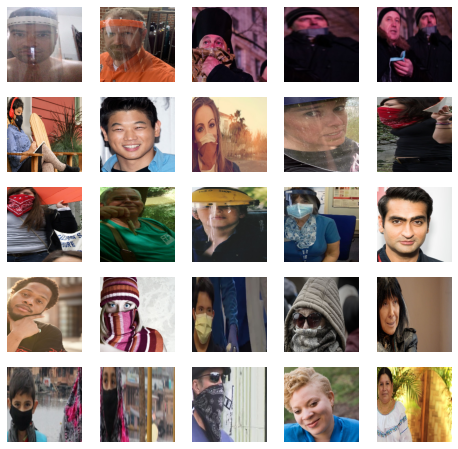

In [ ]:
display_25_images(custom_data[:25])

### Import 2nd Dataset


In [ ]:
hr_resized_data , hr_numeric_labels = dataset_kaggle_second()


In [ ]:
print(hr_resized_data.shape,hr_numeric_labels.shape)

(791, 200, 200, 3) (791, 2)


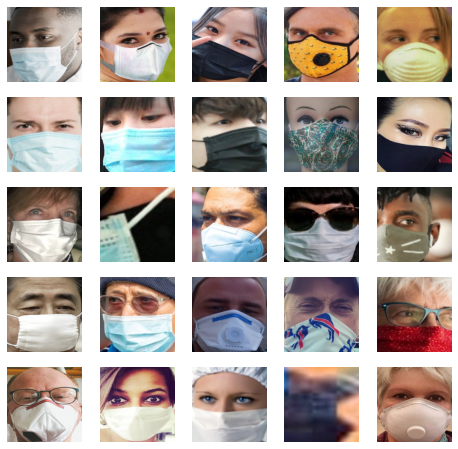

In [ ]:
display_25_images(hr_resized_data[:25])

### Import 3rd Dataset


In [ ]:
resized_data,numeric_labels = kaggle_first()

Generating data in CSV format....
Done!
Labels :  {0: 3232, 1: 717}


In [ ]:
print(resized_data.shape,numeric_labels.shape)

(3949, 200, 200, 3) (3949, 2)


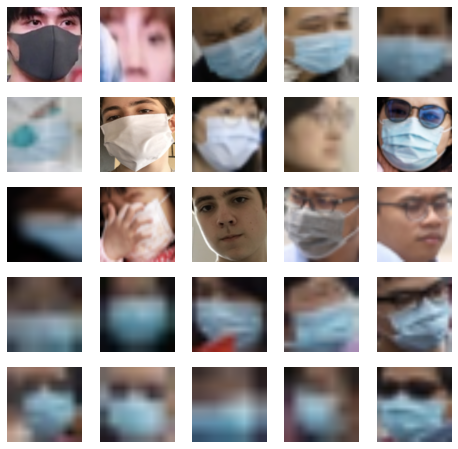

In [ ]:
display_25_images(resized_data[:25])

### Import 4th Dataset


In [ ]:
aug_imges , aug_labels = aug(resized_data,numeric_labels)

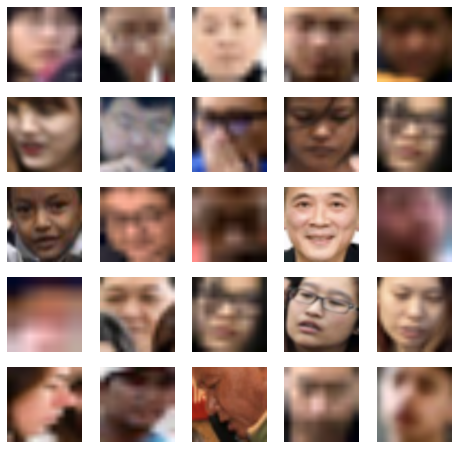

In [ ]:
display_25_images(aug_imges[:25])

In [ ]:
print(aug_imges.shape,aug_labels.shape)

(2502, 200, 200, 3) (2502, 2)


### Combine All Images & Train-Test Split


In [ ]:
np.save('custom_data.npy', custom_data)
np.save('custom_labels.npy', custom_labels)
np.save('hr_resized_data.npy', hr_resized_data)
np.save('hr_numeric_labels.npy', hr_numeric_labels)
np.save('resized_data.npy', resized_data)
np.save('numeric_labels.npy', numeric_labels)
np.save('aug_imges.npy', aug_imges)
np.save('aug_labels.npy', aug_labels)

In [ ]:
final_data = np.vstack([custom_data,hr_resized_data,resized_data,aug_imges])
final_labels = np.vstack([custom_labels,hr_numeric_labels,numeric_labels,aug_labels])

In [ ]:
del custom_data , custom_labels , hr_resized_data,\
hr_numeric_labels , resized_data ,numeric_labels,
aug_imges , aug_labels

In [ ]:
np.save('final_data.npy', final_data)
np.save('final_labels.npy', final_labels)

In [ ]:
final_data = np.load('final_data.npy') 
final_labels = np.load('final_labels.npy')

In [ ]:
print(final_data.shape)
print(final_labels.shape)
print()
target_counts(final_labels)

(12243, 200, 200, 3)
(12243, 2)


In [ ]:
x_train , y_train , x_test , y_test = define_train_test_split(n=2000,
                                                              final_data=final_data,
                                                              final_labels=final_labels)

print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)

del final_data , final_labels

(10243, 200, 200, 3) (10243, 2)
(2000, 200, 200, 3) (2000, 2)


### Create & Train Model

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4)
model = Sequential()
model.add(Conv2D(filters = 10, kernel_size = 3, activation = 'relu', input_shape = (200,200,3)))
model.add(Conv2D(filters = 10, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = 2, padding = 'valid'))
model.add(Conv2D(filters = 10, kernel_size = 3, activation = 'relu'))
model.add(Conv2D(filters = 10, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = 2, padding = 'valid'))
model.add(Conv2D(filters = 16, kernel_size = 3, activation = 'relu'))
model.add(Conv2D(filters = 16, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = 2, padding = 'valid'))
model.add(Conv2D(filters = 32, kernel_size = 3, activation = 'relu'))
model.add(Conv2D(filters = 32, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = 2, padding = 'valid'))
model.add(Flatten())
model.add(Dense(1024,activation='relu'))
model.add(Dense(256,activation='relu'))
model.add(Dense(32,activation='relu'))
model.add(Dense(units = 2, activation = 'sigmoid'))
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=opt,loss="categorical_crossentropy",metrics ="accuracy")

In [ ]:
history = model.fit(x_train, y_train, epochs=30 , batch_size=32 , validation_data=(x_test,y_test),callbacks=[callback])


Epoch 1/30
321/321 [==============================] - 13s 30ms/step - loss: 0.4187 - accuracy: 0.7969 - val_loss: 0.3433 - val_accuracy: 0.8405
Epoch 2/30
321/321 [==============================] - 8s 24ms/step - loss: 0.3525 - accuracy: 0.8331 - val_loss: 0.3581 - val_accuracy: 0.8210
Epoch 3/30
321/321 [==============================] - 8s 24ms/step - loss: 0.3395 - accuracy: 0.8426 - val_loss: 0.3174 - val_accuracy: 0.8550
Epoch 4/30
321/321 [==============================] - 8s 23ms/step - loss: 0.3273 - accuracy: 0.8484 - val_loss: 0.3172 - val_accuracy: 0.8545
Epoch 5/30
321/321 [==============================] - 7s 23ms/step - loss: 0.3073 - accuracy: 0.8584 - val_loss: 0.3270 - val_accuracy: 0.8460
Epoch 6/30
321/321 [==============================] - 8s 24ms/step - loss: 0.2980 - accuracy: 0.8652 - val_loss: 0.3299 - val_accuracy: 0.8475
Epoch 7/30
321/321 [==============================] - 7s 23ms/step - loss: 0.2794 - accuracy: 0.8763 - val_loss: 0.3151 - val_accuracy: 0.871

### Evaluate Model

Test accuracy :  86.75 %


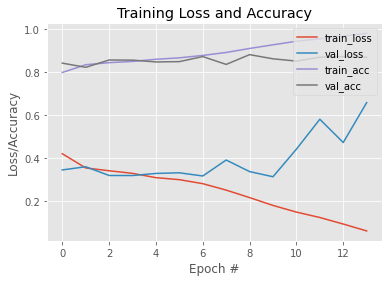

<Figure size 720x720 with 0 Axes>

In [ ]:
metrics = model.evaluate(x_test, y_test, verbose=0)
print('Test accuracy : ', str(round(100 * metrics[1],3))+ ' %')

N = max(history.epoch)+1
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="upper right")
plt.figure(figsize = (10,10))
plt.show()


### Evaluate Model Perfomance with Score Dataset (Unknown Dataset)

In [ ]:
resized_score_data = create_score_data()

In [ ]:
score_img_results = model_score_data(resized_score_data,model=model)

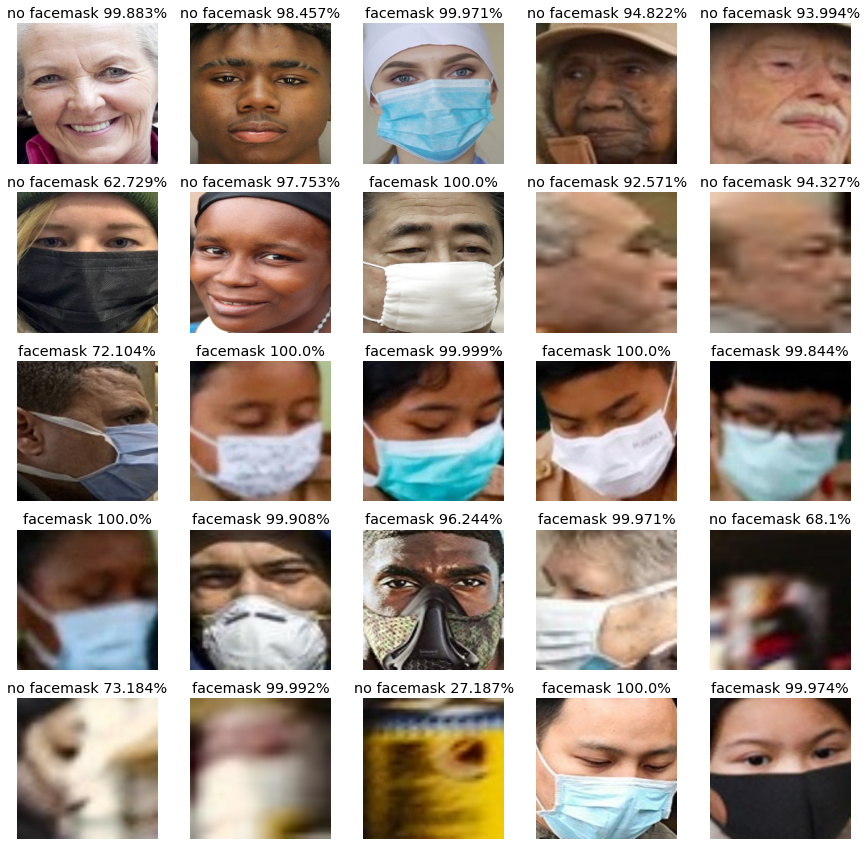

In [ ]:
display_25_images_prob(score_img_results[:25])

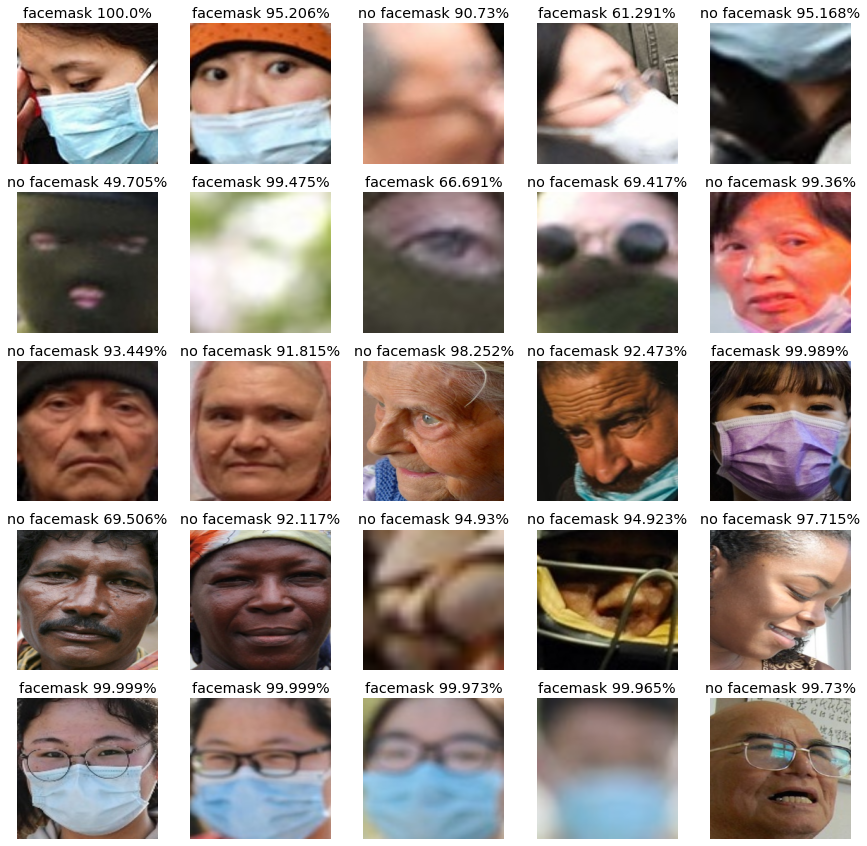

In [ ]:
display_25_images_prob(score_img_results[25:50])

### Visualize Face detection and Perform Classification on random Score & Google images


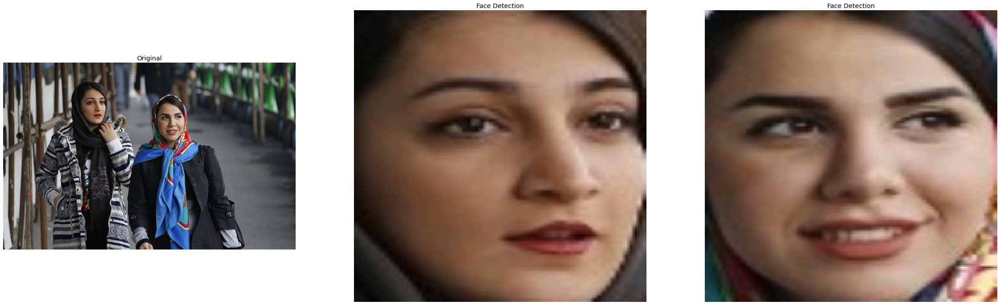

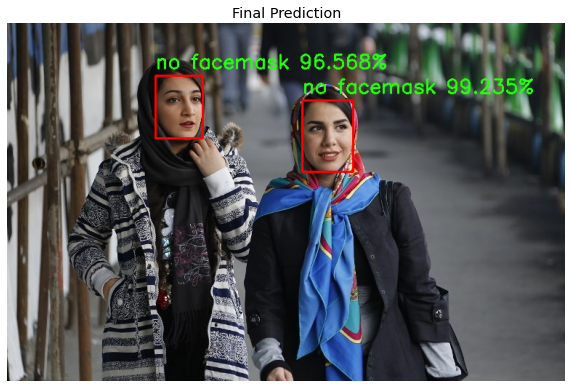

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/0011.jpg",model=model)

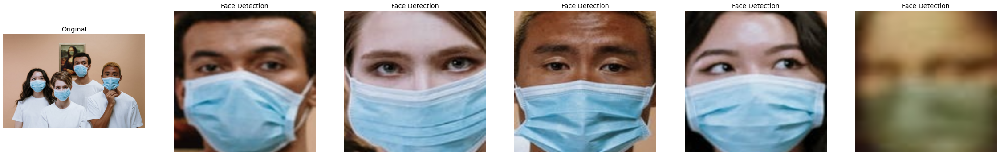

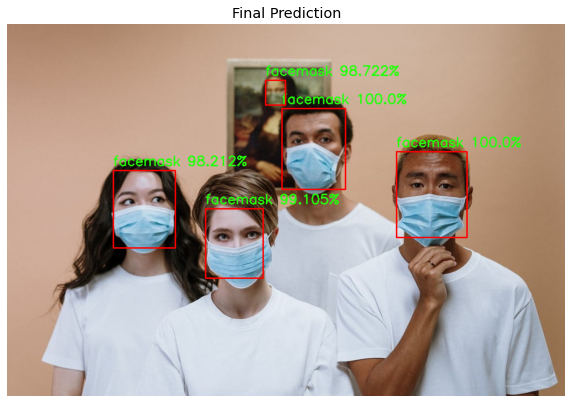

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/0072.jpg",model=model)

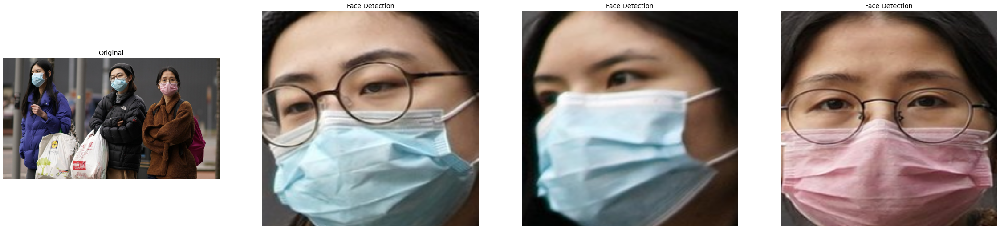

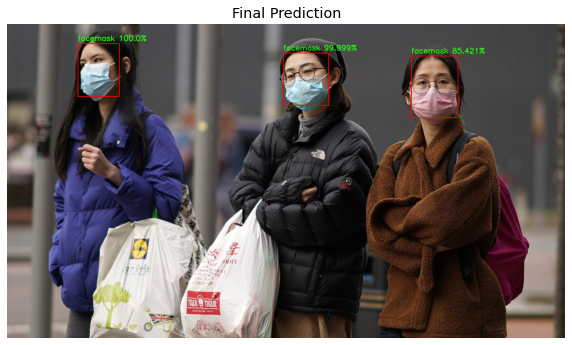

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google.jpg",model=model)

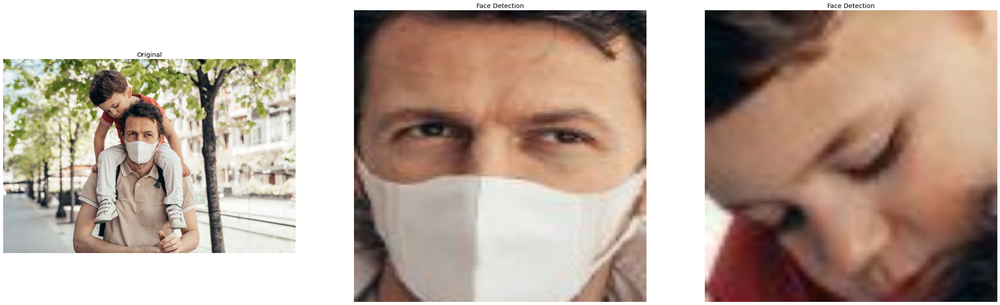

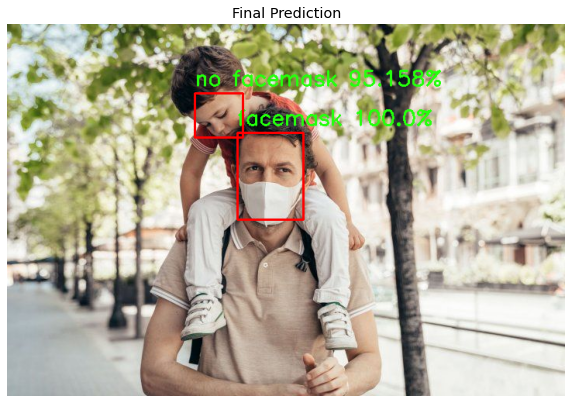

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google2.jpg",model=model)

### Save Model & Re-train with Test Dataset

In [ ]:
del score_img_results ,resized_score_data

In [ ]:
model.save('face_detection_model.h5')

In [ ]:
face_detection_model = keras.models.load_model("face_detection_model.h5")

In [ ]:
print(x_test.shape,y_test.shape)

(2000, 200, 200, 3) (2000, 2)


In [ ]:
face_detection_model.fit(x_test,y_test,epochs=5 , batch_size=32 ,verbose=0)

In [ ]:
face_detection_model.save('final_face_detection_model.h5')

In [ ]:
face_detection_model = keras.models.load_model("Models/final_face_detection_model.h5")

### Load Final Model & only visualize Google Images


In [4]:
test_model = keras.models.load_model("./drive/MyDrive/Models/final_face_detection_model.h5")

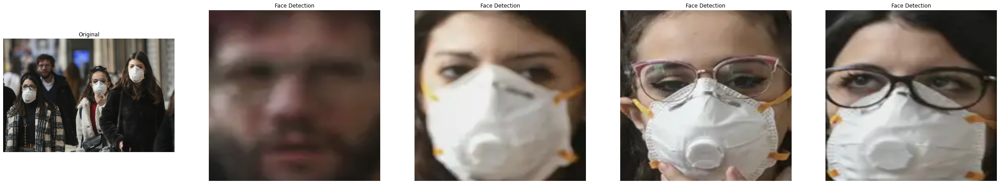

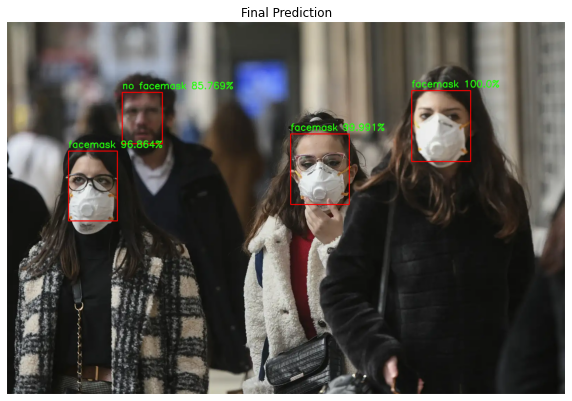

In [6]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/test1.webp",model=test_model)

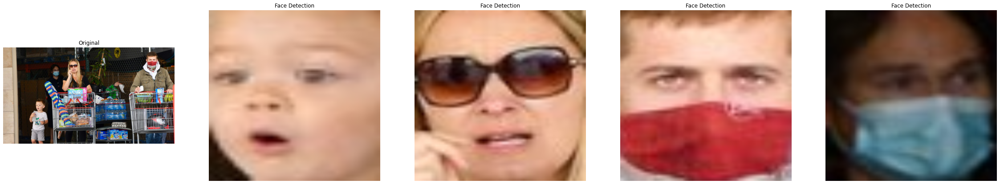

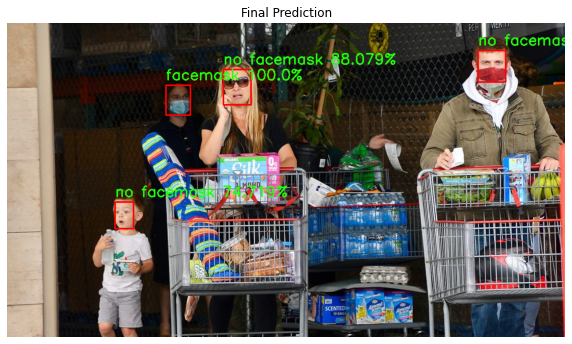

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google13.jpg",model=test_model)

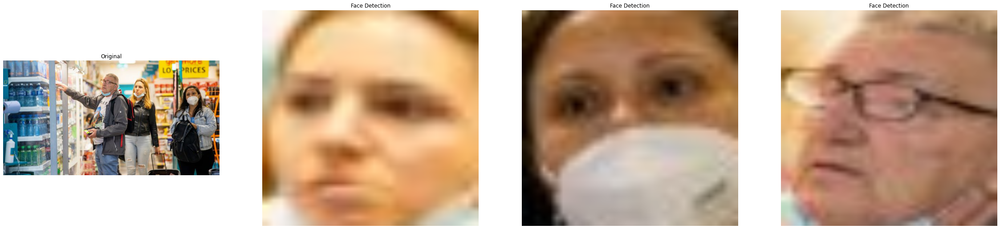

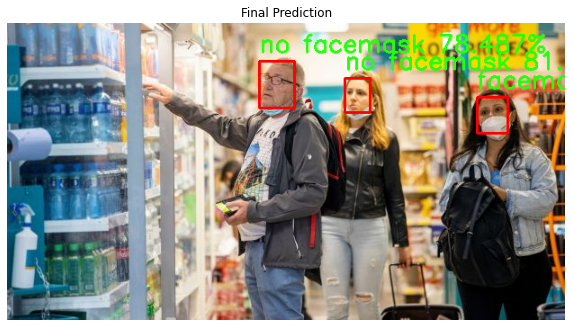

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google14.jpg",model=test_model)

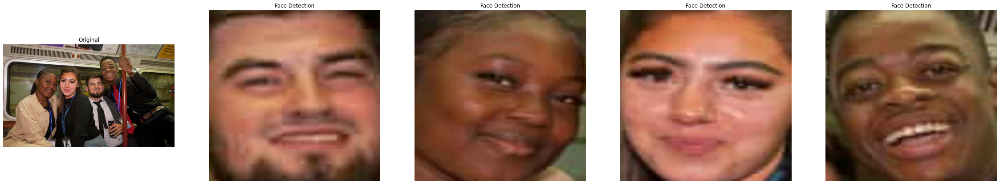

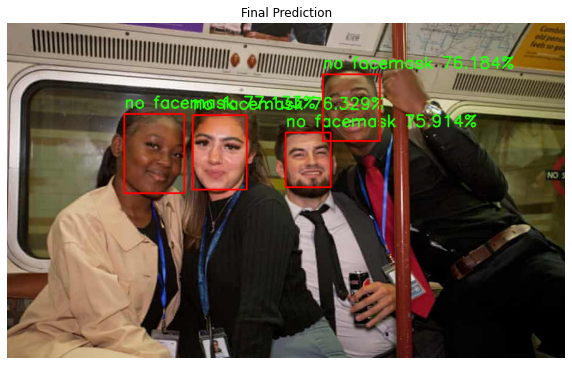

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google15.jpg",model=test_model)

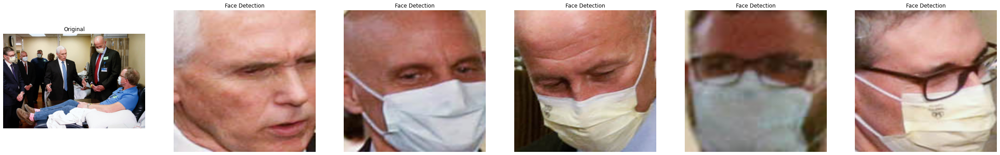

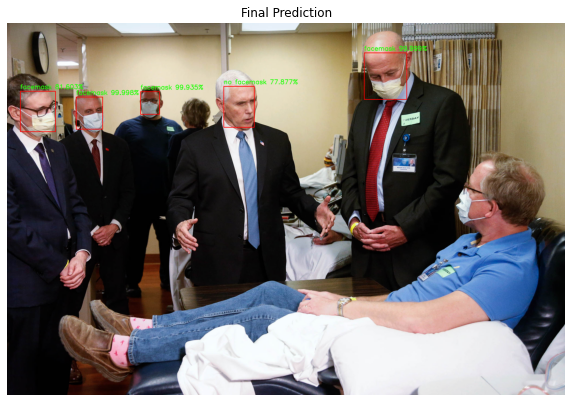

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google17.jpg",model=test_model)

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google20.jpg",model=test_model)

Output hidden; open in https://colab.research.google.com to view.

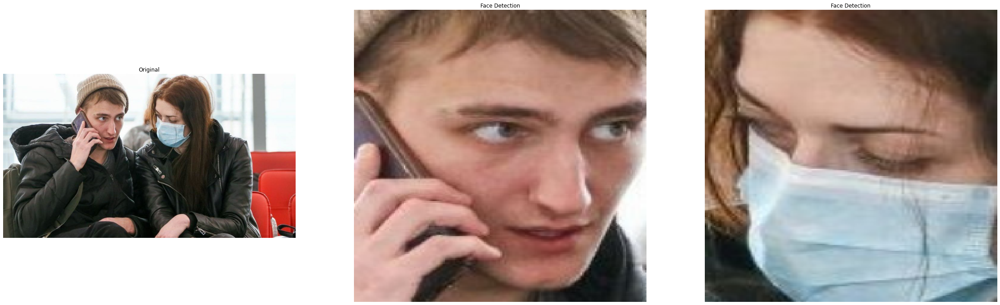

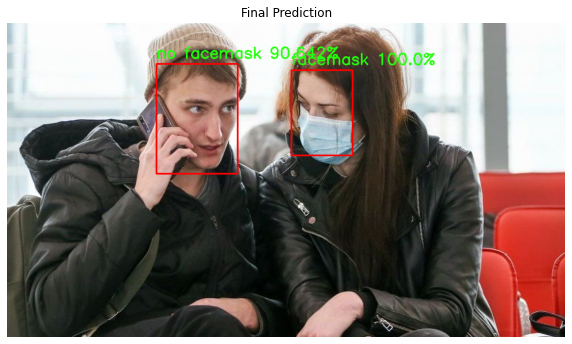

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google21.jpg",model=test_model)

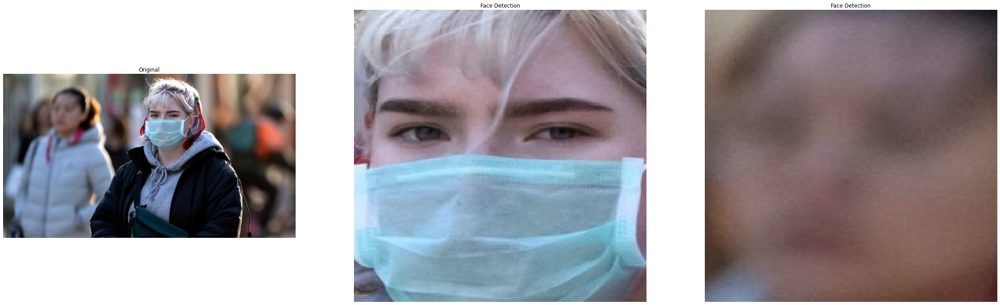

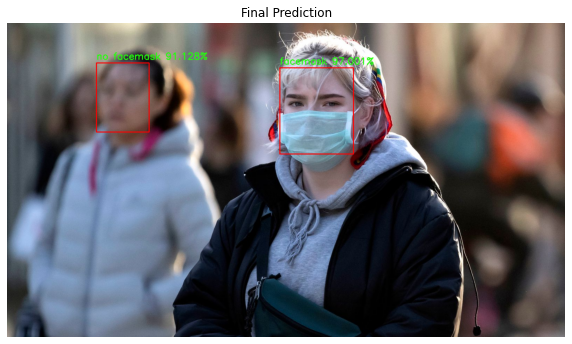

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google22.jpg",model=test_model)

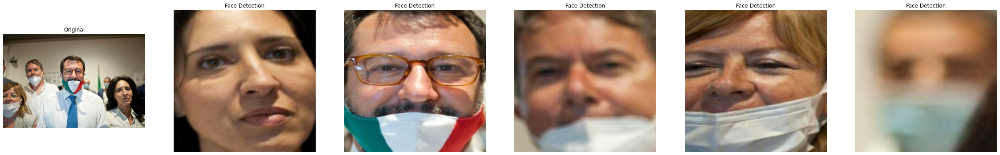

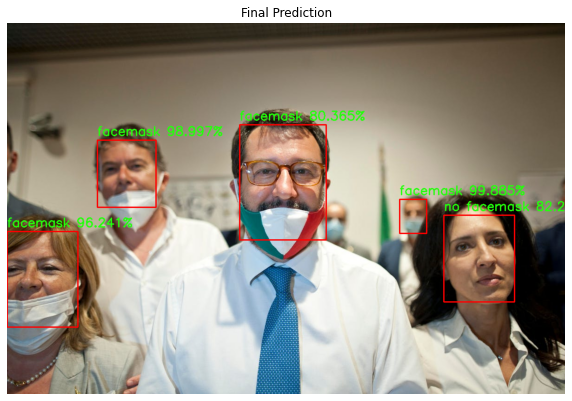

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google23.jpg",model=test_model)

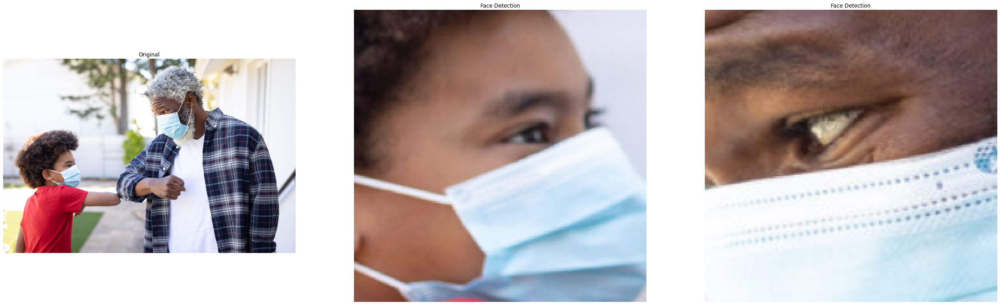

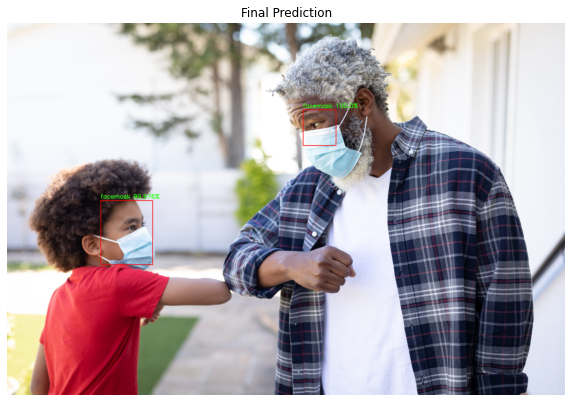

In [ ]:
visualize_score(input_path="./drive/MyDrive/Dataset_medical_mask/score_subset_medical_mask/google24.jpeg",model=test_model)